# Initialisation

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from keras.models import Sequential
from keras.layers import Dense
from sklearn import preprocessing

import scikitplot as skplt
from sklearn.metrics import balanced_accuracy_score
from sklearn import svm, datasets
import sklearn.model_selection as model_selection
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
import io
#from google.colab import files

import math 
import re
import missingno as msno
# Classification algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis , QuadraticDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
import lightgbm as lgb
import xgboost as xgb

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV


# Data Preprocessing

### Upload And Resetting Data 

In [2]:
Transactions_data = pd.read_csv("D:/psALL.csv")

### Resetting data

In [3]:
df=Transactions_data.copy(deep=True)
df['RefTransaction'] = range(1, len(df) + 1)
df=df.drop(['isFlaggedFraud'], axis=1)

In [73]:
dfT = df.copy(deep=True)

### All Data Profiling 

In [ ]:
from pandas_profiling import ProfileReport
prof = ProfileReport(dfT)
prof.to_file(output_file='AllTransactionsProfiling.html')

In [5]:
prof

### Outlier Removal Methode 1 

In [45]:
print('before Outlier detection :')
dfT['isFraud'].value_counts()

before Outlier detection :


0    6354407
1       8213
Name: isFraud, dtype: int64

In [46]:
columns = ['amount','oldbalanceOrg', 'newbalanceOrig', 'oldbalanceDest', 'newbalanceDest']


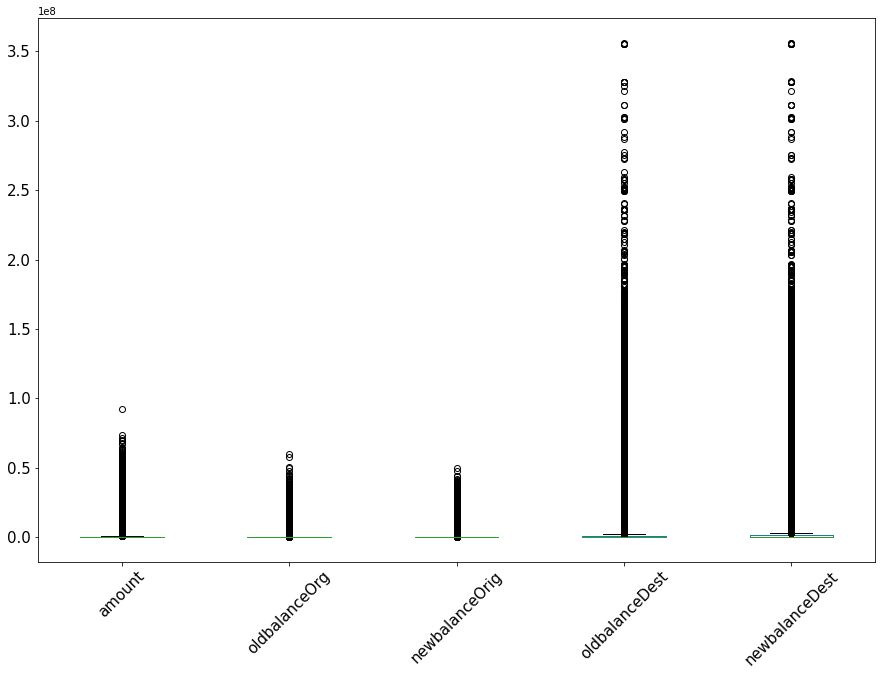

In [33]:
boxplot = dfT[columns].boxplot(grid=False, rot=45, fontsize=15, figsize=(15,10))  


In [47]:
columns = ['amount','oldbalanceOrg', 'newbalanceOrig', 'oldbalanceDest', 'newbalanceDest']

def determine_outlier_boundaries(dfT,columns,th1=0.10, th3=0.9 ):
    lowerboundary=[]
    upperboundary=[]
    for i in columns:
        quartile1 = dfT[i].quantile(th1)
        quartile3 = dfT[i].quantile(th3)
        iqr = quartile3 - quartile1

        upper_limit = quartile3 + 1.5 * iqr
        lower_limit = quartile1 - 1.5 * iqr

        upperboundary.append(upper_limit)     
        lowerboundary.append(lower_limit)
        
    return(lowerboundary,upperboundary)

lowerboundary,upperboundary = determine_outlier_boundaries(dfT,columns,th1=0.25, th3=0.75 )        
print(lowerboundary)
print(upperboundary)

[-279608.29125, -160972.7625, -216387.615, -1414555.06125, -1667863.875]
[501719.33875, 268287.9375, 360646.025, 2357591.76875, 2779773.125]


In [48]:
def remove_outliers(dfT, columns, lowerboundary, upperboundary):
    zip_lower = zip(columns, lowerboundary)
    zip_upper = zip(columns, upperboundary)

    for i,j in zip_lower:
        dfT.drop(dfT[dfT[i] < j].index, inplace = True)

    for i,j in zip_upper:
        dfT.drop(dfT[dfT[i] > j].index, inplace = True)

remove_outliers(dfT, columns, lowerboundary, upperboundary)        

In [36]:
print('after Outlier detection :')
dfT['isFraud'].value_counts()

after Outlier detection :


0    4390123
1       3064
Name: isFraud, dtype: int64

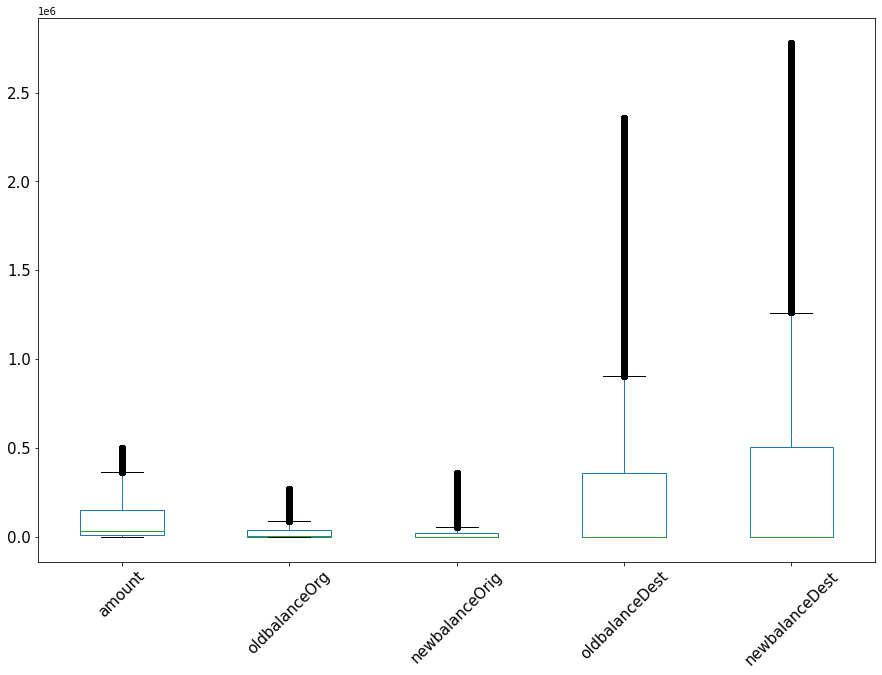

In [37]:
boxplot = dfT[columns].boxplot(grid=False, rot=45, fontsize=15, figsize=(15,10))  


### train test Split + DataSet for Web App part 1

In [74]:
type= df['type']
train, test = train_test_split(df, test_size=0.2, random_state=1,stratify=type)

#### DataSet for Web App Part 1 

In [75]:
#create DfFinal
DfInfoOriginal = pd.concat([train, test], axis=0)

#rename column names 
DfInfoOriginal.rename(columns=lambda x: 'info_'+x, inplace=True)

#reset index 
DfInfoOriginal = DfInfoOriginal.reset_index(drop=True)

In [76]:
DfInfoOriginal

,info_step,info_type,info_amount,info_nameOrig,info_oldbalanceOrg,info_newbalanceOrig,info_nameDest,info_oldbalanceDest,info_newbalanceDest,info_isFraud,info_RefTransaction
0,324,PAYMENT,29309.49,C825881696,0.00,0.00,M543385879,0.00,0.00,0,4468746
1,19,PAYMENT,20721.02,C184133587,0.00,0.00,M369228836,0.00,0.00,0,446003
2,280,CASH_IN,76281.58,C2032177173,598095.37,674376.95,C1015278011,1677479.76,1601198.17,0,3781772
3,15,TRANSFER,47054.53,C607522749,0.00,0.00,C40595393,2745296.71,2817287.29,0,305167
4,10,CASH_OUT,307670.21,C966691947,0.00,0.00,C1793325972,6333876.15,6594726.82,0,87349
...,...,...,...,...,...,...,...,...,...,...,...
6362615,20,PAYMENT,4606.23,C491343941,0.00,0.00,M1178471560,0.00,0.00,0,498725
6362616,303,CASH_IN,597310.25,C1538431283,250541.87,847852.12,C1711170586,727754.30,130444.05,0,4144593
6362617,163,CASH_OUT,57985.96,C2097514982,942587.00,884601.04,C1627928635,341.00,0.00,0,1817980
6362618,335,CASH_IN,154551.64,C83051163,2554812.22,2709363.86,C310662037,1658961.67,1504410.03,0,4772215


### Feature engineering

In [77]:
#max = 8
train_test = pd.concat([train, test], axis=0)

train_test['amount'] = pd.qcut(train_test['amount'], 8)
train_test[['amount', 'isFraud']].groupby(['amount'], as_index=False).mean().sort_values(by='amount', ascending=True)


,amount,isFraud
0,"(-0.001, 5711.688]",0.000216
1,"(5711.688, 13389.57]",0.000204
2,"(13389.57, 30078.641]",0.000431
3,"(30078.641, 74871.94]",0.000917
4,"(74871.94, 135330.949]",0.000938
5,"(135330.949, 208721.478]",0.000826
6,"(208721.478, 325987.369]",0.000928
7,"(325987.369, 92445516.64]",0.005867


In [78]:
DfCa_Band = train_test[['RefTransaction','amount']]
DfCa_Band= DfCa_Band.rename(columns={"amount": "amount_Band"})

train= pd.merge(train, DfCa_Band, how="left", on='RefTransaction')
test= pd.merge(test, DfCa_Band, how="left", on='RefTransaction')

In [79]:
#max = 8
train_test = pd.concat([train, test], axis=0)

train_test['step'] = pd.qcut(train_test['step'], 5)
train_test[['step', 'isFraud']].groupby(['step'], as_index=False).mean().sort_values(by='step', ascending=True)


,step,isFraud
0,"(0.999, 135.0]",0.001196
1,"(135.0, 206.0]",0.000596
2,"(206.0, 281.0]",0.000708
3,"(281.0, 355.0]",0.000595
4,"(355.0, 743.0]",0.003403


In [80]:
DfCa_Band = train_test[['RefTransaction','step']]
DfCa_Band= DfCa_Band.rename(columns={"step": "step_Band"})

train= pd.merge(train, DfCa_Band, how="left", on='RefTransaction')
test= pd.merge(test, DfCa_Band, how="left", on='RefTransaction')

### Remove ID features + DataSet for Web App part 2 

In [81]:
train=train.drop(['nameOrig', 'nameDest','RefTransaction'], axis=1)
test=test.drop(['nameOrig', 'nameDest','RefTransaction'], axis=1)

#### DataSet for Web App Part 2

In [82]:
# adding new features to DfFinal
dfCombinedNewFeatures = pd.concat([train, test], axis=0)
dfCombinedNewFeatures=dfCombinedNewFeatures.drop(['type','step','amount','oldbalanceOrg','newbalanceOrig','oldbalanceDest','newbalanceDest','isFraud'], axis=1)

#rename column names 
dfCombinedNewFeatures.rename(columns=lambda x: 'info_'+x, inplace=True)

#resetting index
dfCombinedNewFeatures = dfCombinedNewFeatures.reset_index(drop=True)

dfFinal = pd.concat([DfInfoOriginal, dfCombinedNewFeatures], axis=1)

In [83]:
dfFinal

,info_step,info_type,info_amount,info_nameOrig,info_oldbalanceOrg,info_newbalanceOrig,info_nameDest,info_oldbalanceDest,info_newbalanceDest,info_isFraud,info_RefTransaction,info_amount_Band,info_step_Band
0,324,PAYMENT,29309.49,C825881696,0.00,0.00,M543385879,0.00,0.00,0,4468746,"(13389.57, 30078.641]","(281.0, 355.0]"
1,19,PAYMENT,20721.02,C184133587,0.00,0.00,M369228836,0.00,0.00,0,446003,"(13389.57, 30078.641]","(0.999, 135.0]"
2,280,CASH_IN,76281.58,C2032177173,598095.37,674376.95,C1015278011,1677479.76,1601198.17,0,3781772,"(74871.94, 135330.949]","(206.0, 281.0]"
3,15,TRANSFER,47054.53,C607522749,0.00,0.00,C40595393,2745296.71,2817287.29,0,305167,"(30078.641, 74871.94]","(0.999, 135.0]"
4,10,CASH_OUT,307670.21,C966691947,0.00,0.00,C1793325972,6333876.15,6594726.82,0,87349,"(208721.478, 325987.369]","(0.999, 135.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6362615,20,PAYMENT,4606.23,C491343941,0.00,0.00,M1178471560,0.00,0.00,0,498725,"(-0.001, 5711.688]","(0.999, 135.0]"
6362616,303,CASH_IN,597310.25,C1538431283,250541.87,847852.12,C1711170586,727754.30,130444.05,0,4144593,"(325987.369, 92445516.64]","(281.0, 355.0]"
6362617,163,CASH_OUT,57985.96,C2097514982,942587.00,884601.04,C1627928635,341.00,0.00,0,1817980,"(30078.641, 74871.94]","(135.0, 206.0]"
6362618,335,CASH_IN,154551.64,C83051163,2554812.22,2709363.86,C310662037,1658961.67,1504410.03,0,4772215,"(135330.949, 208721.478]","(281.0, 355.0]"


### Codage et mise à l'échelle des variabels + DataSet for Web App part 3

In [84]:
# our only var Categorielle
train = pd.get_dummies(train, columns=['type'])
test = pd.get_dummies(test, columns=['type'])

In [85]:
# our var num
for t in [train,test]:
  ColNum = ['step', 'amount', 'oldbalanceOrg', 'newbalanceOrig',
       'oldbalanceDest', 'newbalanceDest']
  features = t[ColNum]

  MinMaxScaler = preprocessing.MinMaxScaler().fit(features.values)
  features = MinMaxScaler.transform(features.values)

  t[ColNum] = features

In [13]:
# vis to know who has guassian distribution 
#from scipy.stats import probplot

#trainNum = train.select_dtypes(include=['int64','float64']).columns

#for i in trainNum: 
 #   probplot(x=train[i],dist='norm',plot=plt) 
  #  plt.title(i) 
   # plt.show()

In [86]:
# our new Band_features
trainCat = train.select_dtypes(include=['category']).columns

labelenc=preprocessing.LabelEncoder()

for col in trainCat:
    train[col]=labelenc.fit_transform(train[col])
    test[col]=labelenc.fit_transform(test[col])

In [87]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5090096 entries, 0 to 5090095
Data columns (total 14 columns):
 #   Column          Dtype  
---  ------          -----  
 0   step            float64
 1   amount          float64
 2   oldbalanceOrg   float64
 3   newbalanceOrig  float64
 4   oldbalanceDest  float64
 5   newbalanceDest  float64
 6   isFraud         int64  
 7   amount_Band     int32  
 8   step_Band       int32  
 9   type_CASH_IN    uint8  
 10  type_CASH_OUT   uint8  
 11  type_DEBIT      uint8  
 12  type_PAYMENT    uint8  
 13  type_TRANSFER   uint8  
dtypes: float64(6), int32(2), int64(1), uint8(5)
memory usage: 373.8 MB


#### DataSet for Web App part 3 

In [88]:
train

,step,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud,amount_Band,step_Band,type_CASH_IN,type_CASH_OUT,type_DEBIT,type_PAYMENT,type_TRANSFER
0,0.435310,0.000317,0.000000,0.000000,0.000000,0.000000,0,2,3,0,0,0,1,0
1,0.024259,0.000224,0.000000,0.000000,0.000000,0.000000,0,2,0,0,0,0,1,0
2,0.376011,0.000825,0.010038,0.013600,0.004712,0.004495,0,4,2,1,0,0,0,0
3,0.018868,0.000509,0.000000,0.000000,0.007711,0.007910,0,3,0,0,0,0,0,1
4,0.012129,0.003328,0.000000,0.000000,0.017791,0.018515,0,6,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5090091,0.367925,0.000446,0.000341,0.000000,0.001544,0.001659,0,3,2,0,1,0,0,0
5090092,0.374663,0.000299,0.000186,0.000000,0.001132,0.001209,0,2,2,0,1,0,0,0
5090093,0.502695,0.000380,0.000077,0.000000,0.000000,0.000000,0,3,4,0,0,0,1,0
5090094,0.370620,0.002843,0.000646,0.006076,0.018994,0.018248,0,6,2,1,0,0,0,0


In [89]:
# adding new features to DfFinal
dfCombinedAFterCodage = pd.concat([train, test], axis=0)

#resetting index
dfCombinedAFterCodage = dfCombinedAFterCodage.reset_index(drop=True)

dfWebApproche2 = pd.concat([dfFinal, dfCombinedAFterCodage], axis=1)

In [110]:
dfWebApproche2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6362620 entries, 0 to 6362619
Data columns (total 27 columns):
 #   Column               Dtype  
---  ------               -----  
 0   info_step            int64  
 1   info_type            object 
 2   info_amount          float64
 3   info_nameOrig        object 
 4   info_oldbalanceOrg   float64
 5   info_newbalanceOrig  float64
 6   info_nameDest        object 
 7   info_oldbalanceDest  float64
 8   info_newbalanceDest  float64
 9   info_isFraud         int64  
 10  info_RefTransaction  int64  
 11  info_amount_Band     object 
 12  info_step_Band       object 
 13  step                 float64
 14  amount               float64
 15  oldbalanceOrg        float64
 16  newbalanceOrig       float64
 17  oldbalanceDest       float64
 18  newbalanceDest       float64
 19  isFraud              int64  
 20  amount_Band          int32  
 21  step_Band            int32  
 22  type_CASH_IN         uint8  
 23  type_CASH_OUT        uint8  
 24

In [109]:
dfWebApproche2[['info_amount_Band','info_step_Band']] = dfWebApproche2[['info_amount_Band','info_step_Band']].astype('str') 


In [112]:
ddf= dfWebApproche2.head(100)

In [114]:
ddf.to_csv('dfWebApproche2(2).csv',index=False)

In [113]:
ddf

,info_step,info_type,info_amount,info_nameOrig,info_oldbalanceOrg,info_newbalanceOrig,info_nameDest,info_oldbalanceDest,info_newbalanceDest,info_isFraud,...,oldbalanceDest,newbalanceDest,isFraud,amount_Band,step_Band,type_CASH_IN,type_CASH_OUT,type_DEBIT,type_PAYMENT,type_TRANSFER
0,324,PAYMENT,29309.49,C825881696,0.00,0.00,M543385879,0.00,0.00,0,...,0.000000,0.000000,0,2,3,0,0,0,1,0
1,19,PAYMENT,20721.02,C184133587,0.00,0.00,M369228836,0.00,0.00,0,...,0.000000,0.000000,0,2,0,0,0,0,1,0
2,280,CASH_IN,76281.58,C2032177173,598095.37,674376.95,C1015278011,1677479.76,1601198.17,0,...,0.004712,0.004495,0,4,2,1,0,0,0,0
3,15,TRANSFER,47054.53,C607522749,0.00,0.00,C40595393,2745296.71,2817287.29,0,...,0.007711,0.007910,0,3,0,0,0,0,0,1
4,10,CASH_OUT,307670.21,C966691947,0.00,0.00,C1793325972,6333876.15,6594726.82,0,...,0.017791,0.018515,0,6,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,303,PAYMENT,24272.63,C1173909426,414.00,0.00,M627315633,0.00,0.00,0,...,0.000000,0.000000,0,2,3,0,0,0,1,0
96,16,CASH_IN,443117.25,C1462396992,6557061.16,7000178.40,C1119895357,1244648.96,801531.71,0,...,0.003496,0.002250,0,7,0,1,0,0,0,0
97,664,CASH_OUT,18760.77,C1355966213,15974.00,0.00,C1332746259,0.00,18760.77,0,...,0.000000,0.000053,0,2,4,0,1,0,0,0
98,350,DEBIT,9304.40,C338008382,51694.00,42389.60,C124961136,3586200.23,3595504.63,0,...,0.010073,0.010095,0,1,3,0,0,1,0,0


### undersampling 

In [91]:
train['isFraud'].value_counts()

0    5083527
1       6569
Name: isFraud, dtype: int64

In [92]:
X_train = train.drop(labels = ['isFraud'],axis = 1)
y_train = train['isFraud']

X_test = test.drop(labels = ['isFraud'],axis = 1)
y_test = test['isFraud']


In [93]:
from imblearn.under_sampling import OneSidedSelection
undersample = OneSidedSelection(n_neighbors=1, n_seeds_S=5000)

In [94]:
X_train, y_train = undersample.fit_resample(X_train, y_train)
X_train, y_train = undersample.fit_resample(X_train, y_train)
X_train, y_train = undersample.fit_resample(X_train, y_train)

In [95]:
y_train.value_counts()

0    29462
1     6569
Name: isFraud, dtype: int64

In [96]:
sm = SMOTE(random_state=42)
X_train, y_train = sm.fit_resample(X_train, y_train)

In [97]:
y_train.value_counts()

0    29462
1    29462
Name: isFraud, dtype: int64

In [98]:
# reduction of test samples cuz >1M 

In [99]:
y_test.value_counts()

0    1270880
1       1644
Name: isFraud, dtype: int64

In [100]:
X_test, y_test = undersample.fit_resample(X_test, y_test)
X_test, y_test = undersample.fit_resample(X_test, y_test)

In [101]:
y_test.value_counts()

0    9715
1    1644
Name: isFraud, dtype: int64

### export train data 

In [54]:
tr = X_train

In [57]:
tr['isFraud'] = y_train.tolist()

In [59]:
tr.to_csv('tr.csv')

# df with splitted data/ Plot / Resampling using SMOTE

### New Df with Splitted Data

In [9]:
dfT['type'].value_counts()

CASH_OUT    2237500
PAYMENT     2151495
CASH_IN     1399284
TRANSFER     532909
DEBIT         41432
Name: type, dtype: int64

In [10]:
dfFraud = dfT[dfT['isFraud']==1]
dfFraud.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8213 entries, 2 to 6362619
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   step            8213 non-null   int64  
 1   type            8213 non-null   object 
 2   amount          8213 non-null   float64
 3   nameOrig        8213 non-null   object 
 4   oldbalanceOrg   8213 non-null   float64
 5   newbalanceOrig  8213 non-null   float64
 6   nameDest        8213 non-null   object 
 7   oldbalanceDest  8213 non-null   float64
 8   newbalanceDest  8213 non-null   float64
 9   isFraud         8213 non-null   int64  
 10  isFlaggedFraud  8213 non-null   int64  
 11  RefTransaction  8213 non-null   int64  
dtypes: float64(5), int64(4), object(3)
memory usage: 834.1+ KB


In [11]:
dfNotFraud = dfT[dfT['isFraud']==0]
dfNotFraud.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6354407 entries, 0 to 6362323
Data columns (total 12 columns):
 #   Column          Dtype  
---  ------          -----  
 0   step            int64  
 1   type            object 
 2   amount          float64
 3   nameOrig        object 
 4   oldbalanceOrg   float64
 5   newbalanceOrig  float64
 6   nameDest        object 
 7   oldbalanceDest  float64
 8   newbalanceDest  float64
 9   isFraud         int64  
 10  isFlaggedFraud  int64  
 11  RefTransaction  int64  
dtypes: float64(5), int64(4), object(3)
memory usage: 630.2+ MB


In [12]:
dfFraud['type'].value_counts()

CASH_OUT    4116
TRANSFER    4097
Name: type, dtype: int64

In [13]:
dfNotFraud['type'].value_counts()

CASH_OUT    2233384
PAYMENT     2151495
CASH_IN     1399284
TRANSFER     528812
DEBIT         41432
Name: type, dtype: int64

In [14]:
type= dfNotFraud['type']

In [15]:
#Splitting dfNotFraud into smaller groups
NotFraud1, NotFraud2 = train_test_split(dfNotFraud, test_size=0.015, random_state=1,stratify=type)

In [16]:
NotFraud2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 95317 entries, 5340041 to 4771348
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   step            95317 non-null  int64  
 1   type            95317 non-null  object 
 2   amount          95317 non-null  float64
 3   nameOrig        95317 non-null  object 
 4   oldbalanceOrg   95317 non-null  float64
 5   newbalanceOrig  95317 non-null  float64
 6   nameDest        95317 non-null  object 
 7   oldbalanceDest  95317 non-null  float64
 8   newbalanceDest  95317 non-null  float64
 9   isFraud         95317 non-null  int64  
 10  isFlaggedFraud  95317 non-null  int64  
 11  RefTransaction  95317 non-null  int64  
dtypes: float64(5), int64(4), object(3)
memory usage: 9.5+ MB


In [17]:
NotFraud2['type'].value_counts()

CASH_OUT    33501
PAYMENT     32273
CASH_IN     20989
TRANSFER     7932
DEBIT         622
Name: type, dtype: int64

In [18]:
df = pd.concat([NotFraud2,dfFraud])

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103530 entries, 5340041 to 6362619
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   step            103530 non-null  int64  
 1   type            103530 non-null  object 
 2   amount          103530 non-null  float64
 3   nameOrig        103530 non-null  object 
 4   oldbalanceOrg   103530 non-null  float64
 5   newbalanceOrig  103530 non-null  float64
 6   nameDest        103530 non-null  object 
 7   oldbalanceDest  103530 non-null  float64
 8   newbalanceDest  103530 non-null  float64
 9   isFraud         103530 non-null  int64  
 10  isFlaggedFraud  103530 non-null  int64  
 11  RefTransaction  103530 non-null  int64  
dtypes: float64(5), int64(4), object(3)
memory usage: 10.3+ MB


In [20]:
df['type'].value_counts()

CASH_OUT    37617
PAYMENT     32273
CASH_IN     20989
TRANSFER    12029
DEBIT         622
Name: type, dtype: int64

In [21]:
df['isFraud'].value_counts()

0    95317
1     8213
Name: isFraud, dtype: int64

### Data Profiling

In [ ]:
from pandas_profiling import ProfileReport
prof = ProfileReport(df)
prof.to_file(output_file='TransactionsProfiling.html')

In [23]:
df

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,RefTransaction
1361310,138,CASH_OUT,163077.56,C1177231018,6652.00,0.0,C1265979849,73461.99,236539.55,0,0,1361311
496091,20,CASH_OUT,222535.49,C66097961,11836.00,0.0,C1908624385,73235.22,81133.91,0,0,496092
4932405,350,CASH_OUT,249515.48,C767716436,25269.00,0.0,C687598734,0.00,249515.48,0,0,4932406
4427084,322,CASH_OUT,336443.34,C1726585541,0.00,0.0,C1074144378,1631579.12,1968022.46,0,0,4427085
6360809,717,CASH_OUT,131854.45,C814998409,942.00,0.0,C1828383235,67537.21,199391.66,0,0,6360810
...,...,...,...,...,...,...,...,...,...,...,...,...
6362605,742,CASH_OUT,54652.46,C43545501,54652.46,0.0,C830041824,0.00,54652.46,1,0,6362606
6362608,742,TRANSFER,258355.42,C1226129332,258355.42,0.0,C1744173808,0.00,0.00,1,0,6362609
6362609,742,CASH_OUT,258355.42,C1113162093,258355.42,0.0,C797688696,25176.67,283532.09,1,0,6362610
6362610,742,TRANSFER,63416.99,C778071008,63416.99,0.0,C1812552860,0.00,0.00,1,0,6362611


In [25]:
prof

### Plot

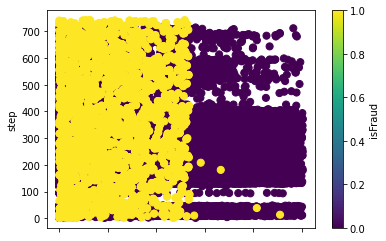

In [26]:
df.plot.scatter(x="amount", y="step", c="isFraud", cmap="viridis", s=50);


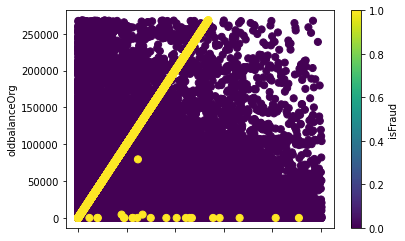

In [71]:
df.plot.scatter(x="amount", y="oldbalanceOrg", c="isFraud", cmap="viridis", s=50);


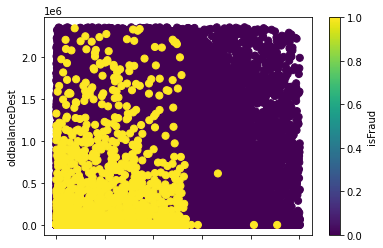

In [73]:
df.plot.scatter(x="amount", y="oldbalanceDest", c="isFraud", cmap="viridis", s=50);


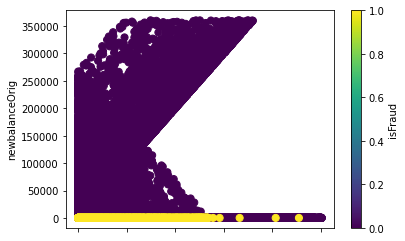

In [74]:
df.plot.scatter(x="amount", y="newbalanceOrig", c="isFraud", cmap="viridis", s=50);


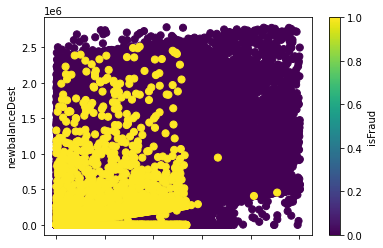

In [75]:
df.plot.scatter(x="amount", y="newbalanceDest", c="isFraud", cmap="viridis", s=50);


### Resampling using Smote

In [15]:
X = train.drop(labels = ['isFraud'],axis = 1)
y = train['isFraud']

X_test = test.drop(labels = ['isFraud'],axis = 1)
y_test = test['isFraud']
 
print('Before Resampling: ','\n\n',y.value_counts())
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

Before Resampling:  

 0    5083527
1       6569
Name: isFraud, dtype: int64


In [16]:
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)
print('After Resampling: ','\n\n',y_res.value_counts())

After Resampling:  

 0    5083527
1    5083527
Name: isFraud, dtype: int64


In [17]:
X_train = X_res
y_train = y_res

In [18]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10167054 entries, 0 to 10167053
Data columns (total 7 columns):
 #   Column          Dtype  
---  ------          -----  
 0   step            float64
 1   type            int32  
 2   amount          float64
 3   oldbalanceOrg   float64
 4   newbalanceOrig  float64
 5   oldbalanceDest  float64
 6   newbalanceDest  float64
dtypes: float64(6), int32(1)
memory usage: 504.2 MB


In [19]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1272524 entries, 5236820 to 4103558
Data columns (total 7 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   step            1272524 non-null  float64
 1   type            1272524 non-null  int32  
 2   amount          1272524 non-null  float64
 3   oldbalanceOrg   1272524 non-null  float64
 4   newbalanceOrig  1272524 non-null  float64
 5   oldbalanceDest  1272524 non-null  float64
 6   newbalanceDest  1272524 non-null  float64
dtypes: float64(6), int32(1)
memory usage: 72.8 MB


# Modeling

## Accuracy Scores

In [47]:
names = [ "Logistic Regression", "Nearest Neighbors", "Naive Bayes","Decision Tree", "Random Forest", "AdaBoost", "Gradient Boosting", 
         "LDA", "QDA", "Neural Net", "LightGBM", "XGBoost" ]    
        
classifiers = [
    LogisticRegression(),
    KNeighborsClassifier(5),
    GaussianNB(),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    AdaBoostClassifier(),
    GradientBoostingClassifier(),
    LinearDiscriminantAnalysis(),
    QuadraticDiscriminantAnalysis(),
    MLPClassifier(alpha=1, max_iter=1000),
    lgb.LGBMClassifier(),    
    xgb.XGBClassifier()
   ]

Logistic Regression
accuracy_scores :  0.7354
balanced_accuracy_score :  0.7260306812055235


D:\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


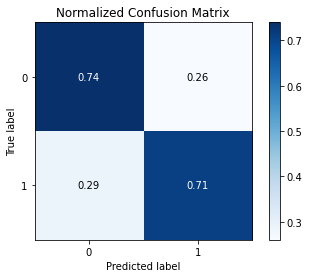

Nearest Neighbors
accuracy_scores :  0.7993
balanced_accuracy_score :  0.812677806558401


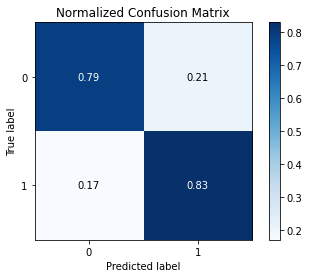

Naive Bayes
accuracy_scores :  0.1801
balanced_accuracy_score :  0.5203978937756265


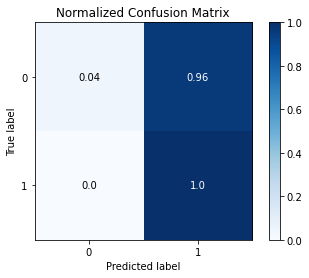

Decision Tree
accuracy_scores :  0.8101
balanced_accuracy_score :  0.8858152393400616


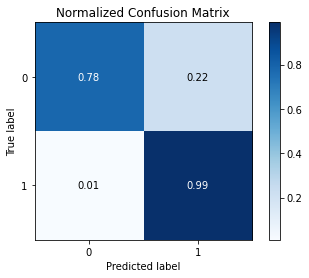

Random Forest
accuracy_scores :  0.9343
balanced_accuracy_score :  0.8725536055688516


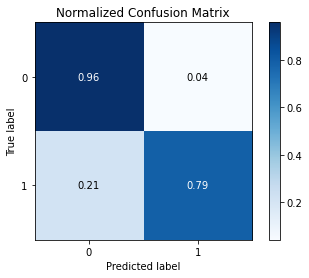

AdaBoost
accuracy_scores :  0.9047
balanced_accuracy_score :  0.9273947434910366


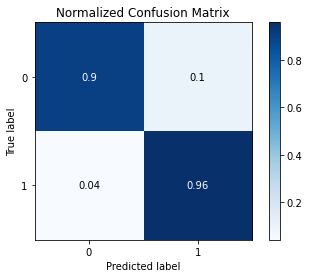

Gradient Boosting
accuracy_scores :  0.9395
balanced_accuracy_score :  0.958614466640008


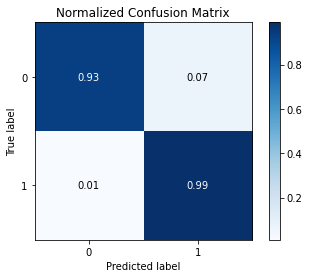

LDA
accuracy_scores :  0.7455
balanced_accuracy_score :  0.7311996297644697


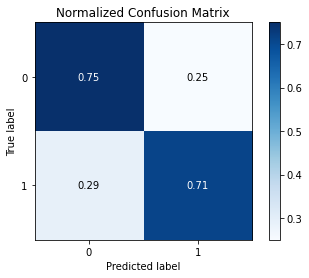

QDA
accuracy_scores :  0.1439
balanced_accuracy_score :  0.5


D:\Python\Python310\lib\site-packages\sklearn\discriminant_analysis.py:878: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
D:\Python\Python310\lib\site-packages\sklearn\discriminant_analysis.py:903: RuntimeWarning: divide by zero encountered in power
  X2 = np.dot(Xm, R * (S ** (-0.5)))
D:\Python\Python310\lib\site-packages\sklearn\discriminant_analysis.py:903: RuntimeWarning: invalid value encountered in multiply
  X2 = np.dot(Xm, R * (S ** (-0.5)))
D:\Python\Python310\lib\site-packages\sklearn\discriminant_analysis.py:906: RuntimeWarning: divide by zero encountered in log
  u = np.asarray([np.sum(np.log(s)) for s in self.scalings_])
D:\Python\Python310\lib\site-packages\sklearn\discriminant_analysis.py:903: RuntimeWarning: divide by zero encountered in power
  X2 = np.dot(Xm, R * (S ** (-0.5)))
D:\Python\Python310\lib\site-packages\sklearn\discriminant_analysis.py:903: RuntimeWarning: invalid value encountered in multiply
  X2 = np.dot(Xm, R * (S ** (

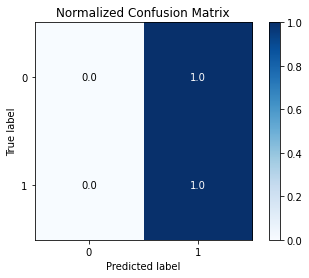

Neural Net
accuracy_scores :  0.7506
balanced_accuracy_score :  0.7098725412958841


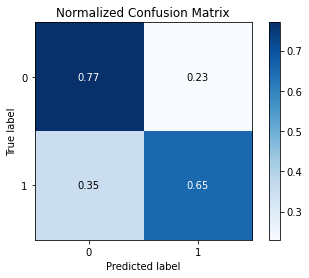

LightGBM
accuracy_scores :  0.9483
balanced_accuracy_score :  0.9677733695014255


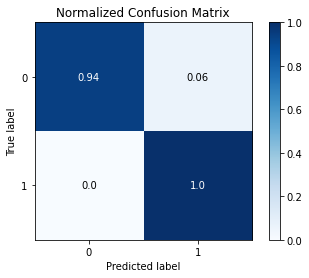

XGBoost
accuracy_scores :  0.9534
balanced_accuracy_score :  0.9712945610590208


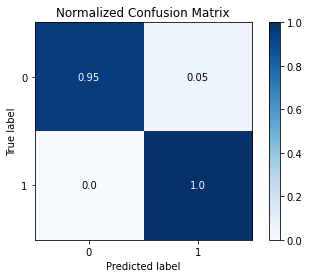

In [48]:

accuracy_scores = []
balanced_accuracy_scores=[]
for name, clf in zip(names, classifiers):
    clf.fit(X_train, y_train)
    
    #normal score: 
    score = clf.score(X_test, y_test)
    score = round(score, 4)
    accuracy_scores.append(score)
    print(name)
    print('accuracy_scores : ' , score)
    #Generate predictions with the model using our X values
    y_pred = clf.predict(X_test)

    #Balanced Accuracy Score:
    balanced_accuracy_scores.append(balanced_accuracy_score(y_test, y_pred))
    print('balanced_accuracy_score : ' , balanced_accuracy_score(y_test, y_pred))

    #Get the normalized confusion matrix
    skplt.metrics.plot_confusion_matrix(y_test, y_pred, normalize=True)
    plt.show()



In [49]:
DfAccuracy_scores = pd.DataFrame({"Classifiers": names, "Accuracy Scores": accuracy_scores})
DfBalanced_accuracy_scores = pd.DataFrame({"Classifiers": names, "Balanced Accuracy Scores": balanced_accuracy_scores})

DfAccuracy_scores=DfAccuracy_scores.sort_values(by = 'Accuracy Scores' , ascending = False)[['Classifiers', 'Accuracy Scores']]
DfBalanced_accuracy_scores=DfBalanced_accuracy_scores.sort_values(by = 'Balanced Accuracy Scores' , ascending = False)[['Classifiers', 'Balanced Accuracy Scores']]

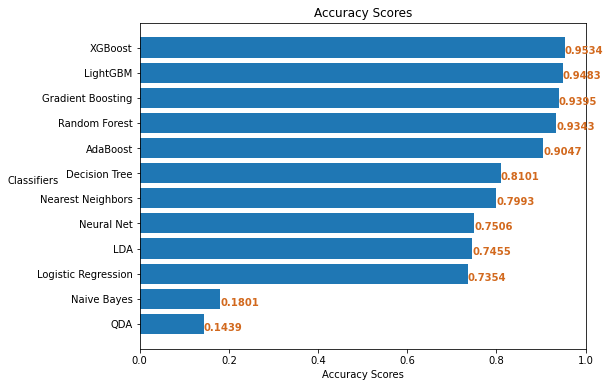

In [50]:
fig, ax = plt.subplots(figsize=(8,6))
x = DfAccuracy_scores['Accuracy Scores']
y = DfAccuracy_scores['Classifiers']
ax.barh(y, x, align='center')

for i, v in enumerate(x):
    ax.text(v, i + .25, str(float("{:.4f}".format(v))),
            color = 'chocolate', fontweight = 'bold')

ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Accuracy Scores')
ax.set_ylabel('Classifiers', rotation=0)
ax.set_title('Accuracy Scores')
plt.show()

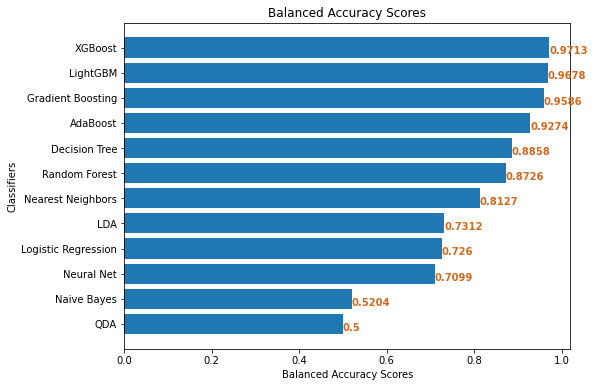

In [51]:
fig, ax = plt.subplots(figsize=(8,6))
x = DfBalanced_accuracy_scores['Balanced Accuracy Scores']
y = DfBalanced_accuracy_scores['Classifiers']
ax.barh(y, x, align='center')

for i, v in enumerate(x):
    ax.text(v, i + .25, str(float("{:.4f}".format(v))),
            color = 'chocolate', fontweight = 'bold')

ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Balanced Accuracy Scores')
ax.set_ylabel('Classifiers', rotation=90)
ax.set_title('Balanced Accuracy Scores')
plt.show()

## Cross Validation

In [37]:
X_combined = np.r_[X_train, X_test]
y_combined = np.r_[y_train, y_test]

X_combined = pd.concat([X_train, X_test], axis=0)
y_combined = pd.concat([y_train, y_test], axis=0)

In [38]:
names2 = [ "XGBoost","LightGBM",
         "Gradient Boosting", "AdaBoost" ]    
        
classifiers2 = [
    xgb.XGBClassifier(),
    lgb.LGBMClassifier(),
    GradientBoostingClassifier(),
    AdaBoostClassifier()

   ]


In [39]:
CrossValScore =[]
for name, clf in zip(names2, classifiers2):
    scores = cross_val_score(clf, X_combined, y_combined, cv = 10, scoring='balanced_accuracy')
    CrossValScore.append('{:.4f}'.format(scores.mean()))
    print(name , ':{:.4f}'.format(scores.mean()))

XGBoost :0.9781
LightGBM :0.9663
Gradient Boosting :0.9137
AdaBoost :0.8131


In [40]:
CVS = [float(i) for i in CrossValScore]

CVS


[0.9781, 0.9663, 0.9137, 0.8131]

In [28]:
CVS=[0.9781, 0.9663, 0.9137, 0.8131]


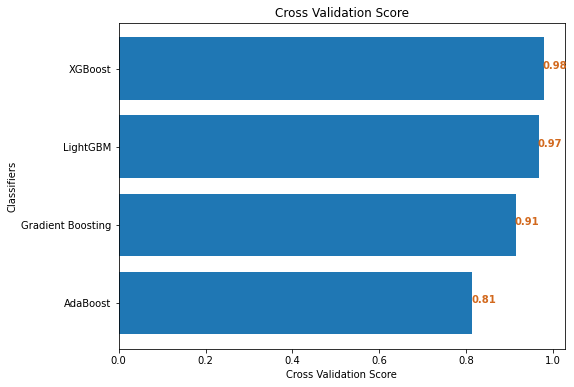

In [29]:
CrossValidation = {'Classifier':names2  ,
         'Cross Validation Score':CVS
                   }
CrossValidation = pd.DataFrame(CrossValidation)      
CrossValidation=CrossValidation.sort_values(by = 'Cross Validation Score' , ascending = False)[['Classifier', 'Cross Validation Score']]

fig, ax = plt.subplots(figsize=(8,6))
x = CrossValidation['Cross Validation Score']
y = CrossValidation['Classifier']
ax.barh(y, x, align='center')

for i, v in enumerate(x):
    ax.text(v-0.0019, i , str(float("{:.2f}".format(v))),
            color = 'chocolate', fontweight = 'bold')

ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Cross Validation Score')
ax.set_ylabel('Classifiers', rotation=90)
ax.set_title('Cross Validation Score')
plt.show()

        

## learning curves :

In [56]:
X_combined = pd.concat([X_train, X_test])

y_combined = y_train.append(y_test)

C:\Users\Alea\AppData\Local\Temp\ipykernel_17908\2417805603.py:3: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  y_combined = y_train.append(y_test)


In [57]:
X_combined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 72746 entries, 0 to 11513
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   step            72746 non-null  float64
 1   amount          72746 non-null  float64
 2   oldbalanceOrg   72746 non-null  float64
 3   newbalanceOrig  72746 non-null  float64
 4   oldbalanceDest  72746 non-null  float64
 5   newbalanceDest  72746 non-null  float64
 6   amount_Band     72746 non-null  int32  
 7   step_Band       72746 non-null  int32  
 8   type_CASH_IN    72746 non-null  uint8  
 9   type_CASH_OUT   72746 non-null  uint8  
 10  type_DEBIT      72746 non-null  uint8  
 11  type_PAYMENT    72746 non-null  uint8  
 12  type_TRANSFER   72746 non-null  uint8  
dtypes: float64(6), int32(2), uint8(5)
memory usage: 4.8 MB


In [43]:
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit


def plot_learning_curve(
    estimator,
    title,
    X,
    y,
    axes=None,
    ylim=None,
    cv=None,
    n_jobs=None,
    train_sizes=np.linspace(0.1, 1.0, 5),
):
    """
    Generate 3 plots: the test and training learning curve, the training
    samples vs fit times curve, the fit times vs score curve.

    Parameters
    ----------
    estimator : estimator instance
        An estimator instance implementing `fit` and `predict` methods which
        will be cloned for each validation.

    title : str
        Title for the chart.

    X : array-like of shape (n_samples, n_features)
        Training vector, where ``n_samples`` is the number of samples and
        ``n_features`` is the number of features.

    y : array-like of shape (n_samples) or (n_samples, n_features)
        Target relative to ``X`` for classification or regression;
        None for unsupervised learning.

    axes : array-like of shape (3,), default=None
        Axes to use for plotting the curves.

    ylim : tuple of shape (2,), default=None
        Defines minimum and maximum y-values plotted, e.g. (ymin, ymax).

    cv : int, cross-validation generator or an iterable, default=None
        Determines the cross-validation splitting strategy.
        Possible inputs for cv are:

          - None, to use the default 5-fold cross-validation,
          - integer, to specify the number of folds.
          - :term:`CV splitter`,
          - An iterable yielding (train, test) splits as arrays of indices.

        For integer/None inputs, if ``y`` is binary or multiclass,
        :class:`StratifiedKFold` used. If the estimator is not a classifier
        or if ``y`` is neither binary nor multiclass, :class:`KFold` is used.

        Refer :ref:`User Guide <cross_validation>` for the various
        cross-validators that can be used here.

    n_jobs : int or None, default=None
        Number of jobs to run in parallel.
        ``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.
        ``-1`` means using all processors. See :term:`Glossary <n_jobs>`
        for more details.

    train_sizes : array-like of shape (n_ticks,)
        Relative or absolute numbers of training examples that will be used to
        generate the learning curve. If the ``dtype`` is float, it is regarded
        as a fraction of the maximum size of the training set (that is
        determined by the selected validation method), i.e. it has to be within
        (0, 1]. Otherwise it is interpreted as absolute sizes of the training
        sets. Note that for classification the number of samples usually have
        to be big enough to contain at least one sample from each class.
        (default: np.linspace(0.1, 1.0, 5))
    """
    if axes is None:
        _, axes = plt.subplots(1, 3, figsize=(20, 5))

    axes[0].set_title(title)
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    axes[0].set_xlabel("Training examples")
    axes[0].set_ylabel("Score")

    train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(
        estimator,
        X,
        y,
        cv=cv,
        n_jobs=n_jobs,
        train_sizes=train_sizes,
        return_times=True,
        scoring='balanced_accuracy'
    )
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    fit_times_mean = np.mean(fit_times, axis=1)
    fit_times_std = np.std(fit_times, axis=1)

    # Plot learning curve
    axes[0].grid()
    axes[0].fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    axes[0].fill_between(
        train_sizes,
        test_scores_mean - test_scores_std,
        test_scores_mean + test_scores_std,
        alpha=0.1,
        color="g",
    )
    axes[0].plot(
        train_sizes, train_scores_mean, "o-", color="r", label="Training score"
    )
    axes[0].plot(
        train_sizes, test_scores_mean, "o-", color="g", label="Cross-validation score"
    )
    axes[0].legend(loc="best")

    # Plot n_samples vs fit_times
    axes[1].grid()
    axes[1].plot(train_sizes, fit_times_mean, "o-")
    axes[1].fill_between(
        train_sizes,
        fit_times_mean - fit_times_std,
        fit_times_mean + fit_times_std,
        alpha=0.1,
    )
    axes[1].set_xlabel("Training examples")
    axes[1].set_ylabel("fit_times")
    axes[1].set_title("Scalability of the model")

    # Plot fit_time vs score
    fit_time_argsort = fit_times_mean.argsort()
    fit_time_sorted = fit_times_mean[fit_time_argsort]
    test_scores_mean_sorted = test_scores_mean[fit_time_argsort]
    test_scores_std_sorted = test_scores_std[fit_time_argsort]
    axes[2].grid()
    axes[2].plot(fit_time_sorted, test_scores_mean_sorted, "o-")
    axes[2].fill_between(
        fit_time_sorted,
        test_scores_mean_sorted - test_scores_std_sorted,
        test_scores_mean_sorted + test_scores_std_sorted,
        alpha=0.1,
    )
    axes[2].set_xlabel("fit_times")
    axes[2].set_ylabel("Score")
    axes[2].set_title("Performance of the model")

    return plt


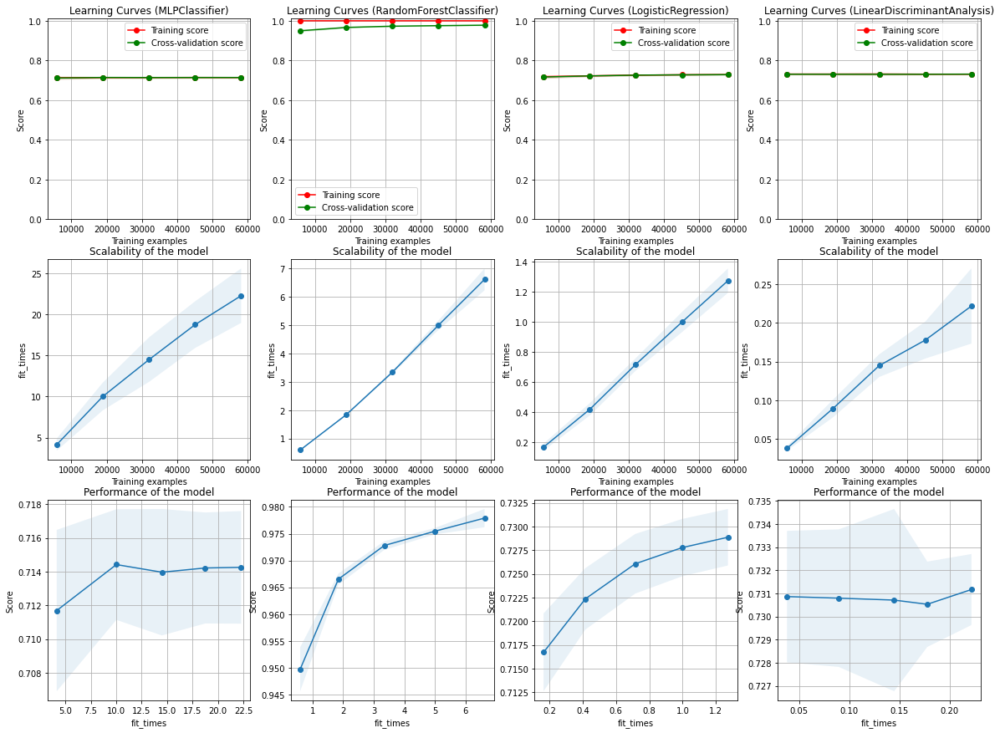

In [58]:

fig, axes = plt.subplots(3, 4, figsize=(20, 15))

X = X_combined
y = y_combined

title = "Learning Curves (MLPClassifier)"
# Cross validation with 50 iterations to get smoother mean test and train
# score curves, each time with 20% data randomly selected as a validation set.
cv = ShuffleSplit(n_splits=50, test_size=0.2, random_state=0)

estimator = MLPClassifier(alpha=1, max_iter=1000)
plot_learning_curve(
    estimator, title, X, y, axes=axes[:, 0], ylim=(0, 1.01), cv=cv, n_jobs=4
)

title = r"Learning Curves (RandomForestClassifier)"
# SVC is more expensive so we do a lower number of CV iterations:
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
estimator = RandomForestClassifier()
plot_learning_curve(
    estimator, title, X, y, axes=axes[:, 1], ylim=(0, 1.01), cv=cv, n_jobs=4
)

title = "Learning Curves (LogisticRegression)"
# Cross validation with 50 iterations to get smoother mean test and train
# score curves, each time with 20% data randomly selected as a validation set.
cv = ShuffleSplit(n_splits=50, test_size=0.2, random_state=0)

estimator = LogisticRegression()
plot_learning_curve(
    estimator, title, X, y, axes=axes[:, 2], ylim=(0, 1.01), cv=cv, n_jobs=4
)

title = r"Learning Curves (LinearDiscriminantAnalysis)"
# SVC is more expensive so we do a lower number of CV iterations:
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
estimator = LinearDiscriminantAnalysis()
plot_learning_curve(
    estimator, title, X, y, axes=axes[:, 3], ylim=(0, 1.01), cv=cv, n_jobs=4
)


plt.show()

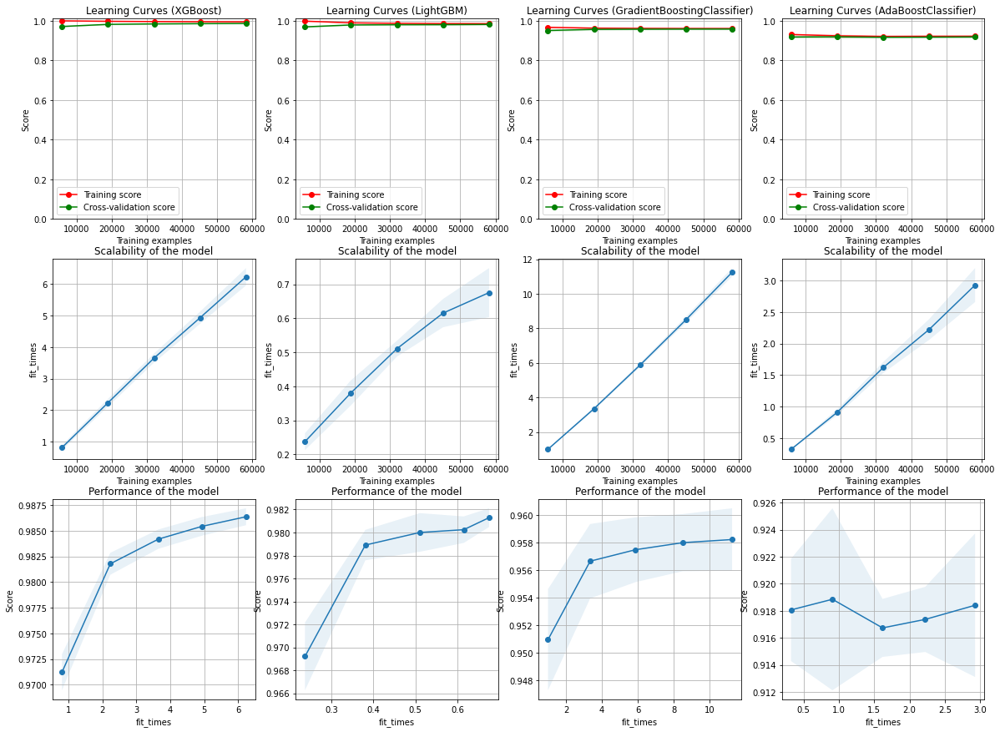

In [59]:

fig, axes = plt.subplots(3, 4, figsize=(20, 15))

X = X_combined
y = y_combined

title = "Learning Curves (XGBoost)"
# Cross validation with 50 iterations to get smoother mean test and train
# score curves, each time with 20% data randomly selected as a validation set.
cv = ShuffleSplit(n_splits=50, test_size=0.2, random_state=0)

estimator = xgb.XGBClassifier()
plot_learning_curve(
    estimator, title, X, y, axes=axes[:, 0], ylim=(0, 1.01), cv=cv, n_jobs=4
)

title = r"Learning Curves (LightGBM)"
# SVC is more expensive so we do a lower number of CV iterations:
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
estimator = lgb.LGBMClassifier()
plot_learning_curve(
    estimator, title, X, y, axes=axes[:, 1], ylim=(0, 1.01), cv=cv, n_jobs=4
)

title = "Learning Curves (GradientBoostingClassifier)"
# Cross validation with 50 iterations to get smoother mean test and train
# score curves, each time with 20% data randomly selected as a validation set.
cv = ShuffleSplit(n_splits=50, test_size=0.2, random_state=0)

estimator = GradientBoostingClassifier()
plot_learning_curve(
    estimator, title, X, y, axes=axes[:, 2], ylim=(0, 1.01), cv=cv, n_jobs=4
)

title = r"Learning Curves (AdaBoostClassifier)"
# SVC is more expensive so we do a lower number of CV iterations:
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
estimator = AdaBoostClassifier()
plot_learning_curve(
    estimator, title, X, y, axes=axes[:, 3], ylim=(0, 1.01), cv=cv, n_jobs=4
)


plt.show()

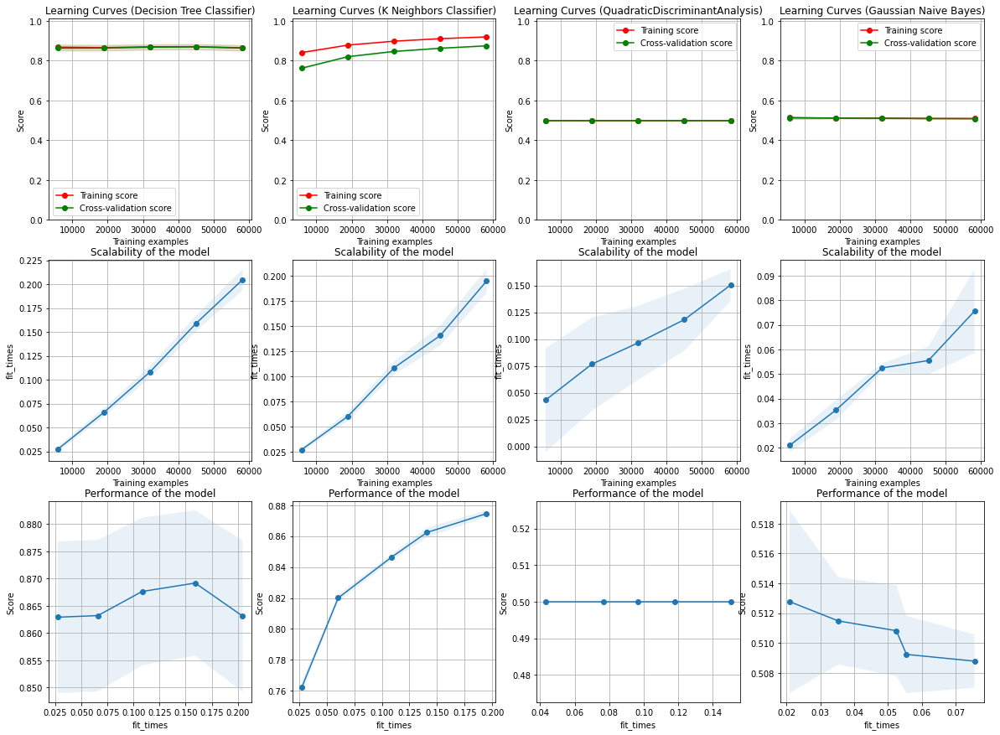

In [61]:

fig, axes = plt.subplots(3, 4, figsize=(20, 15))

X = X_combined
y = y_combined

title = "Learning Curves (Decision Tree Classifier)"
# Cross validation with 50 iterations to get smoother mean test and train
# score curves, each time with 20% data randomly selected as a validation set.
cv = ShuffleSplit(n_splits=50, test_size=0.2, random_state=0)

estimator = DecisionTreeClassifier(max_depth=5)
plot_learning_curve(
    estimator, title, X, y, axes=axes[:, 0], ylim=(0, 1.01), cv=cv, n_jobs=4
)

title = r"Learning Curves (K Neighbors Classifier)"
# SVC is more expensive so we do a lower number of CV iterations:
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
estimator = KNeighborsClassifier(5)
plot_learning_curve(
    estimator, title, X, y, axes=axes[:, 1], ylim=(0, 1.01), cv=cv, n_jobs=4
)

title = "Learning Curves (QuadraticDiscriminantAnalysis)"
# Cross validation with 50 iterations to get smoother mean test and train
# score curves, each time with 20% data randomly selected as a validation set.
cv = ShuffleSplit(n_splits=50, test_size=0.2, random_state=0)

estimator = QuadraticDiscriminantAnalysis()
plot_learning_curve(
    estimator, title, X, y, axes=axes[:, 2], ylim=(0, 1.01), cv=cv, n_jobs=4
)

title = r"Learning Curves (Gaussian Naive Bayes)"
# SVC is more expensive so we do a lower number of CV iterations:
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
estimator = GaussianNB()
plot_learning_curve(
    estimator, title, X, y, axes=axes[:, 3], ylim=(0, 1.01), cv=cv, n_jobs=4
)


plt.show()

## feature importance :

In [38]:
TTnames2 = ["Gradient Boosting" ]    

TTclassifiers2 = [
    GradientBoostingClassifier()
   ]

for name, clf in zip(TTnames2, TTclassifiers2):
    print(name)
    clf.fit(X_train, y_train)

    feature_scores = pd.Series(clf.feature_importances_, index=X_train.columns)

    x=feature_scores.values
    y=feature_scores.index

    print(x)
    print(y)


Gradient Boosting
[1.66794108e-02 2.23306774e-01 1.76248455e-01 1.32492527e-01
 1.53112883e-02 3.68065339e-01 0.00000000e+00 0.00000000e+00
 0.00000000e+00 5.45906575e-02 0.00000000e+00 2.43341818e-05
 1.32812143e-02]
Index(['step', 'amount', 'oldbalanceOrg', 'newbalanceOrig', 'oldbalanceDest',
       'newbalanceDest', 'amount_Band', 'step_Band', 'type_CASH_IN',
       'type_CASH_OUT', 'type_DEBIT', 'type_PAYMENT', 'type_TRANSFER'],
      dtype='object')


In [39]:
GradientBoosting = ['{0:.3f}'.format(i) for i in x]
GradientBoosting = pd.DataFrame(GradientBoosting, columns = ['GradientBoosting'])
GradientBoosting = preprocessing.MinMaxScaler().fit_transform(GradientBoosting)
GradientBoosting = pd.DataFrame(GradientBoosting, columns = ['GradientBoosting'])
GradientBoosting

,GradientBoosting
0,0.046196
1,0.605978
2,0.478261
3,0.358696
4,0.040761
5,1.000000
6,0.000000
7,0.000000
8,0.000000
9,0.149457


In [40]:
LGname = ["LightGBM" ]    

LGclassifier = [
    lgb.LGBMClassifier()
   ]

for name, clf in zip(LGname, LGclassifier):
    print(name)
    clf.fit(X_train, y_train)

    feature_scores = pd.Series(clf.feature_importances_, index=X_train.columns)

    x=feature_scores.values
    y=feature_scores.index

    print(x)
    print(y)

   


LightGBM
[525 913 886 112 188 243   8   1   0  85   0   0  39]
Index(['step', 'amount', 'oldbalanceOrg', 'newbalanceOrig', 'oldbalanceDest',
       'newbalanceDest', 'amount_Band', 'step_Band', 'type_CASH_IN',
       'type_CASH_OUT', 'type_DEBIT', 'type_PAYMENT', 'type_TRANSFER'],
      dtype='object')


In [41]:
LightGBM = x
LightGBM = pd.DataFrame(LightGBM, columns = ['LightGBM'])
LightGBM = preprocessing.MinMaxScaler().fit_transform(LightGBM)
LightGBM = pd.DataFrame(LightGBM, columns = ['LightGBM'])
LightGBM

,LightGBM
0,0.575027
1,1.000000
2,0.970427
3,0.122673
4,0.205915
5,0.266156
6,0.008762
7,0.001095
8,0.000000
9,0.093100


In [42]:
XGBoostname = ["XGBoost" ]    

XGBoostclassifier = [
    xgb.XGBClassifier()
   ]

for name, clf in zip(XGBoostname, XGBoostclassifier):
    print(name)
    clf.fit(X_train, y_train)

    feature_scores = pd.Series(clf.feature_importances_, index=X_train.columns)

    x=feature_scores.values
    y=feature_scores.index

    print(x)
    print(y)

   


XGBoost
[0.01322148 0.07430151 0.06070993 0.18721451 0.02364146 0.30667344
 0.         0.         0.         0.29726762 0.         0.
 0.03697005]
Index(['step', 'amount', 'oldbalanceOrg', 'newbalanceOrig', 'oldbalanceDest',
       'newbalanceDest', 'amount_Band', 'step_Band', 'type_CASH_IN',
       'type_CASH_OUT', 'type_DEBIT', 'type_PAYMENT', 'type_TRANSFER'],
      dtype='object')


In [43]:
XGBoost = ['{0:.3f}'.format(i) for i in x]
XGBoost = pd.DataFrame(XGBoost, columns = ['XGBoost'])
XGBoost = preprocessing.MinMaxScaler().fit_transform(XGBoost)
XGBoost = pd.DataFrame(XGBoost, columns = ['XGBoost'])
XGBoost

,XGBoost
0,0.042345
1,0.241042
2,0.198697
3,0.609121
4,0.078176
5,1.000000
6,0.000000
7,0.000000
8,0.000000
9,0.967427


In [44]:
y=y.to_frame(index=False)
y

,0
0,step
1,amount
2,oldbalanceOrg
3,newbalanceOrig
4,oldbalanceDest
5,newbalanceDest
6,amount_Band
7,step_Band
8,type_CASH_IN
9,type_CASH_OUT


C:\Users\Alea\AppData\Local\Temp\ipykernel_19916\3141041377.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  importance_df['mean'] = importance_df.mean(axis=1)


<AxesSubplot:xlabel='Features'>

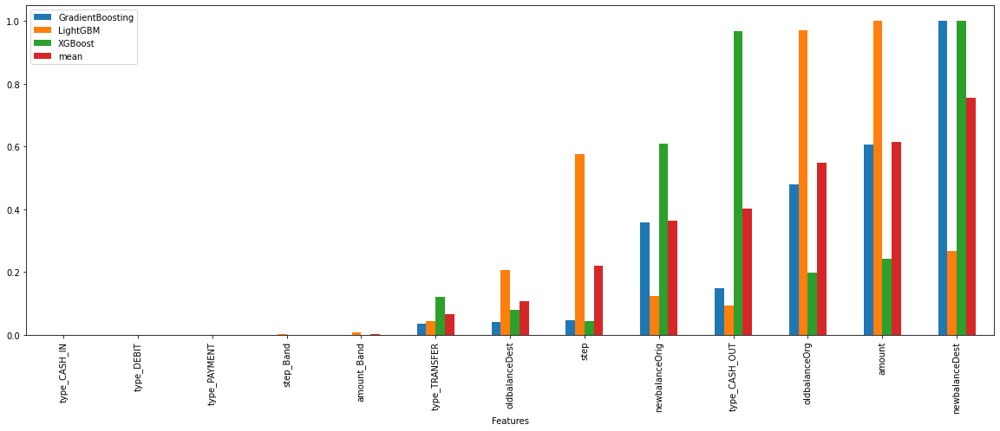

In [46]:
importance_df = pd.concat( [y,GradientBoosting,LightGBM,XGBoost], axis=1)
importance_df['mean'] = importance_df.mean(axis=1)
importance_df.reset_index(drop=True, inplace=True)
importance_df=importance_df.rename(columns={0: "Features"})
importance_df.sort_values('mean').plot(x='Features',kind='bar', figsize=(20, 7))


## Score with less features 

In [30]:
X1_train = X_train.drop(['type_DEBIT','type_PAYMENT','type_CASH_IN','step_Band', 'amount_Band'], axis=1)
X1_test = X_test.drop(['type_DEBIT','type_PAYMENT','type_CASH_IN','step_Band', 'amount_Band'], axis=1)


In [53]:
names = [ "Logistic Regression", "Nearest Neighbors", "Naive Bayes","Decision Tree", "Random Forest", "AdaBoost", "Gradient Boosting", 
         "LDA", "QDA", "Neural Net", "LightGBM", "XGBoost" ]    
        
classifiers = [
    LogisticRegression(),
    KNeighborsClassifier(5),
    GaussianNB(),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    AdaBoostClassifier(),
    GradientBoostingClassifier(),
    LinearDiscriminantAnalysis(),
    QuadraticDiscriminantAnalysis(),
    MLPClassifier(alpha=1, max_iter=1000),
    lgb.LGBMClassifier(),    
    xgb.XGBClassifier()
   ]

Logistic Regression
accuracy_scores :  0.7623
balanced_accuracy_score :  0.7329145305011608


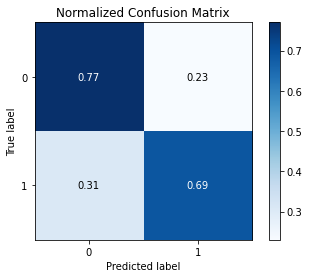

Nearest Neighbors
accuracy_scores :  0.8699
balanced_accuracy_score :  0.8660641635482131


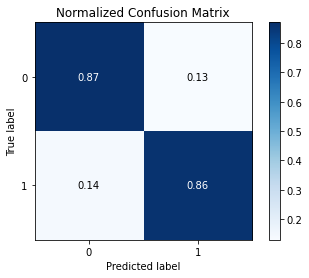

Naive Bayes
accuracy_scores :  0.8828
balanced_accuracy_score :  0.6843592896093329


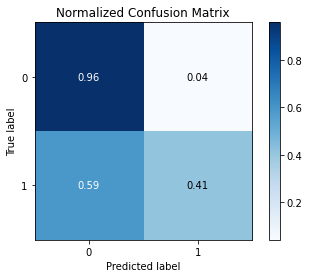

Decision Tree
accuracy_scores :  0.81
balanced_accuracy_score :  0.8857641354970527


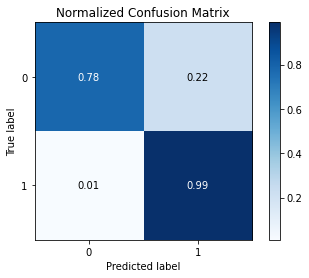

Random Forest
accuracy_scores :  0.9465
balanced_accuracy_score :  0.8870460834810496


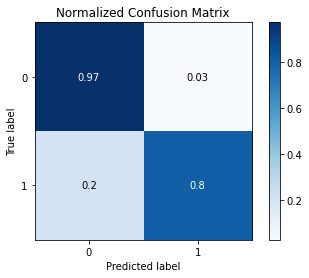

AdaBoost
accuracy_scores :  0.9047
balanced_accuracy_score :  0.9273947434910366


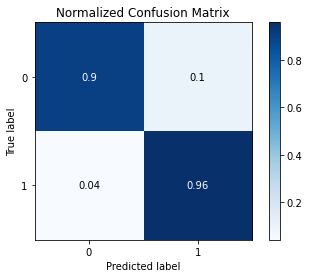

Gradient Boosting
accuracy_scores :  0.9378
balanced_accuracy_score :  0.9575923897798282


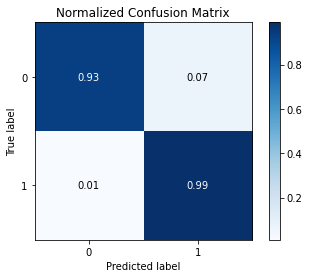

LDA
accuracy_scores :  0.7524
balanced_accuracy_score :  0.706087002365449


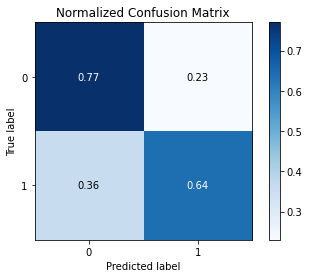

QDA
accuracy_scores :  0.181
balanced_accuracy_score :  0.5209089322057164


D:\Python\Python310\lib\site-packages\sklearn\discriminant_analysis.py:878: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


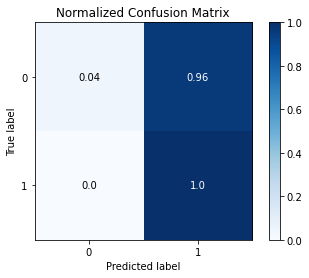

Neural Net
accuracy_scores :  0.6018
balanced_accuracy_score :  0.6148478672165489


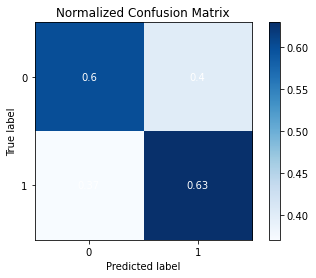

LightGBM
accuracy_scores :  0.9492
balanced_accuracy_score :  0.9682844079315154


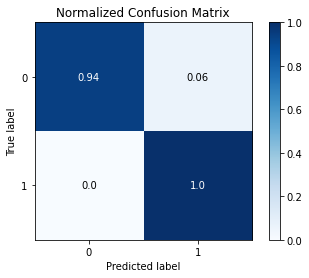

XGBoost
accuracy_scores :  0.9534
balanced_accuracy_score :  0.9712945610590208


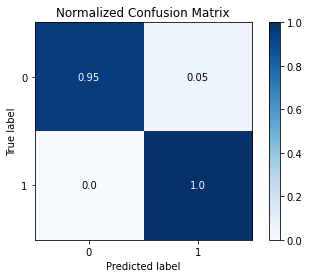

In [54]:

accuracy_scores = []
balanced_accuracy_scores=[]
for name, clf in zip(names, classifiers):
    clf.fit(X1_train, y_train)
    
    #normal score: 
    score = clf.score(X1_test, y_test)
    score = round(score, 4)
    accuracy_scores.append(score)
    print(name)
    print('accuracy_scores : ' , score)
    #Generate predictions with the model using our X values
    y_pred = clf.predict(X1_test)

    #Balanced Accuracy Score:
    balanced_accuracy_scores.append(balanced_accuracy_score(y_test, y_pred))
    print('balanced_accuracy_score : ' , balanced_accuracy_score(y_test, y_pred))

    #Get the normalized confusion matrix
    skplt.metrics.plot_confusion_matrix(y_test, y_pred, normalize=True)
    plt.show()



In [55]:
DfAccuracy_scores = pd.DataFrame({"Classifiers": names, "Accuracy Scores": accuracy_scores})
DfBalanced_accuracy_scores = pd.DataFrame({"Classifiers": names, "Balanced Accuracy Scores": balanced_accuracy_scores})

DfAccuracy_scores=DfAccuracy_scores.sort_values(by = 'Accuracy Scores' , ascending = False)[['Classifiers', 'Accuracy Scores']]
DfBalanced_accuracy_scores=DfBalanced_accuracy_scores.sort_values(by = 'Balanced Accuracy Scores' , ascending = False)[['Classifiers', 'Balanced Accuracy Scores']]

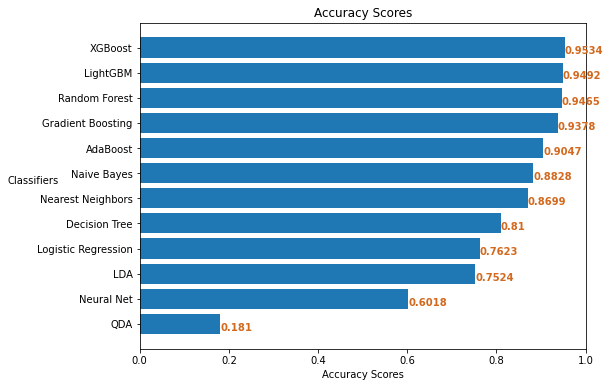

In [56]:
fig, ax = plt.subplots(figsize=(8,6))
x = DfAccuracy_scores['Accuracy Scores']
y = DfAccuracy_scores['Classifiers']
ax.barh(y, x, align='center')

for i, v in enumerate(x):
    ax.text(v, i + .25, str(float("{:.4f}".format(v))),
            color = 'chocolate', fontweight = 'bold')

ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Accuracy Scores')
ax.set_ylabel('Classifiers', rotation=0)
ax.set_title('Accuracy Scores')
plt.show()

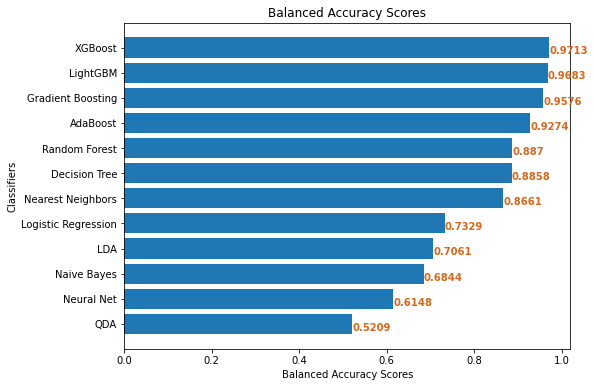

In [57]:
fig, ax = plt.subplots(figsize=(8,6))
x = DfBalanced_accuracy_scores['Balanced Accuracy Scores']
y = DfBalanced_accuracy_scores['Classifiers']
ax.barh(y, x, align='center')

for i, v in enumerate(x):
    ax.text(v, i + .25, str(float("{:.4f}".format(v))),
            color = 'chocolate', fontweight = 'bold')

ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Balanced Accuracy Scores')
ax.set_ylabel('Classifiers', rotation=90)
ax.set_title('Balanced Accuracy Scores')
plt.show()

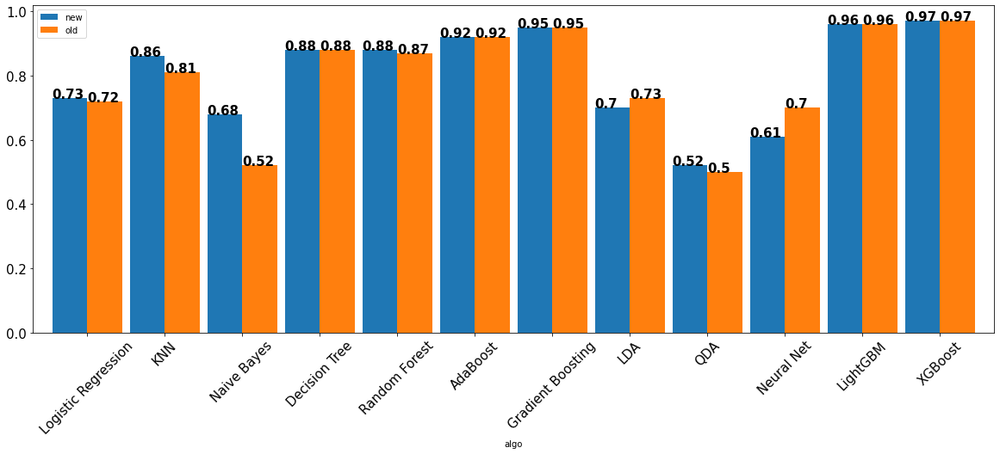

In [28]:
new=pd.DataFrame([0.73,0.86,0.68,0.88,0.88,0.92,0.95,0.70,0.52,0.61,0.96,0.97]).rename(columns={0: "new"})
old=pd.DataFrame([0.72,0.81,0.52,0.88,0.87,0.92,0.95,0.73,0.5,0.70,0.96,0.97]).rename(columns={0: "old"})
algo=pd.DataFrame(["Logistic Regression", "KNN", "Naive Bayes","Decision Tree", "Random Forest", "AdaBoost", "Gradient Boosting", 
         "LDA", "QDA", "Neural Net", "LightGBM", "XGBoost" ]).rename(columns={0: "algo"})

dd = pd.concat( [algo,new,old], axis=1)


ax = dd.plot(x='algo', kind='bar', figsize=(20, 7), width=0.9, rot=45,  fontsize = 15) 

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.0, p.get_height() * 1) ,color = 'black', fontweight = 'bold',  fontsize = 15 )

## Hyperparameter Optimization using GridSearch CV

In [31]:
#X1 and Y1 = after feature selection 

X_combined = np.r_[X1_train, X1_test]
y_combined = np.r_[y_train, y_test]

X_combined = pd.concat([X1_train, X1_test], axis=0)
y_combined = pd.concat([y_train, y_test], axis=0)

In [66]:
#LightGBM
lgb_clf = lgb.LGBMClassifier()

lgb_params={'learning_rate': [0.1, 0.05],
    'num_leaves': [31,35,40],
    'objective' : ['regression','multiclass','multiclassova','num_class'], # for multiple classification
    'colsample_bytree' : [0.9,1],
    'subsample' : [0.5,0.7,0.9],
    'reg_alpha' : [0,0.2,0.4],
    'reg_lambda' : [0,0.2,0.3],
    }

lgb_grid_search = GridSearchCV(estimator = lgb_clf,  
                               param_grid = lgb_params,
                               scoring = 'accuracy',
                               cv = 5,
                               verbose=0)

lgb_grid_search.fit(X_combined, y_combined)

# best score achieved during the GridSearchCV
print('LightGBM GridSearch CV best score : {:.4f}\n\n'.format(lgb_grid_search.best_score_))

# print parameters that give the best results
print('LightGBM Parameters that give the best results :','\n\n', (lgb_grid_search.best_params_))

# print estimator that was chosen by the GridSearch
lgb_best = lgb_grid_search.best_estimator_
print('\n\nLightGBM Estimator that was chosen by the search :','\n\n', (lgb_best))

D:\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
4860 fits failed out of a total of 6480.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3240 fits failed with the following error:
Traceback (most recent call last):
  File "D:\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "D:\Python\Python310\lib\site-packages\lightgbm\sklearn.py", line 967, in fit
    super().fit(X, _y, sample_weight=sample_weight, init_score=init_score, eval_set=valid_sets,
  File "D:\Python\Python310\lib\site-packages\lightgbm\sklearn.py", line 748, in fit
    self._Booster = train(
  File "D:\Python\Pyt

LightGBM GridSearch CV best score : 0.9772


LightGBM Parameters that give the best results : 

 {'colsample_bytree': 0.9, 'learning_rate': 0.1, 'num_leaves': 40, 'objective': 'regression', 'reg_alpha': 0.2, 'reg_lambda': 0.3, 'subsample': 0.5}


LightGBM Estimator that was chosen by the search : 

 LGBMClassifier(colsample_bytree=0.9, num_leaves=40, objective='regression',
               reg_alpha=0.2, reg_lambda=0.3, subsample=0.5)


In [32]:
#Gradient Boosting
gbc_clf = GradientBoostingClassifier()

gbc_params = {'loss' : ["deviance"],
              'n_estimators' : [20,40,60,80],
              'learning_rate': [0.1, 0.05, 0.01],
              'max_depth': [4,6,8],
              'min_samples_leaf': [10,50,100],
              'max_features': [3,5,7]
              }

gbc_grid_search = GridSearchCV(estimator = gbc_clf, 
                               param_grid = gbc_params, 
                               scoring = "accuracy", 
                               cv = 5,
                               verbose = 0)

gbc_grid_search.fit(X_combined,y_combined)

# best score achieved during the GridSearchCV
print('Gradient Boosting GridSearch CV best score : {:.4f}\n\n'.format(gbc_grid_search.best_score_))

# print parameters that give the best results
print('Gradient Boosting Parameters that give the best results :','\n\n', (gbc_grid_search.best_params_))

# print estimator that was chosen by the GridSearch
gbc_best = gbc_grid_search.best_estimator_
print('\n\nGradient Boosting Estimator that was chosen by the search :','\n\n', (gbc_best))

Gradient Boosting GridSearch CV best score : 0.9793


Gradient Boosting Parameters that give the best results : 

 {'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 8, 'max_features': 7, 'min_samples_leaf': 10, 'n_estimators': 80}


Gradient Boosting Estimator that was chosen by the search : 

 GradientBoostingClassifier(max_depth=8, max_features=7, min_samples_leaf=10,
                           n_estimators=80)


In [33]:
#XGBoost
xgb_clf = xgb.XGBClassifier()

xgb_params = {'learning_rate': [0.1],
              'n_estimators' : [100,500,1000],
              'max_depth': [4,6,8],
              'min_child_weight': [1,3,5],
              'gamma':[0,0.2],
              'subsample':[0.7],
              'colsample_bytree':[1],
              'reg_alpha':[0.2],
              'objective': ['binary:logistic'],
              'nthread':[4],
              'scale_pos_weight':[1],
              'seed':[27]
              }

xgb_grid_search = GridSearchCV(estimator = xgb_clf, 
                               param_grid = xgb_params, 
                               scoring = "accuracy", 
                               cv = 5,
                               verbose = 0)

xgb_grid_search.fit(X_combined,y_combined)

# best score achieved during the GridSearchCV
print('XGBoost GridSearch CV best score : {:.4f}\n\n'.format(xgb_grid_search.best_score_))

# print parameters that give the best results
print('XGBoost Parameters that give the best results :','\n\n', (xgb_grid_search.best_params_))

# print estimator that was chosen by the GridSearch
xgb_best = xgb_grid_search.best_estimator_
print('\n\nXGBoost Estimator that was chosen by the search :','\n\n', (xgb_best))

XGBoost GridSearch CV best score : 0.9834


XGBoost Parameters that give the best results : 

 {'colsample_bytree': 1, 'gamma': 0.2, 'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 1000, 'nthread': 4, 'objective': 'binary:logistic', 'reg_alpha': 0.2, 'scale_pos_weight': 1, 'seed': 27, 'subsample': 0.7}


XGBoost Estimator that was chosen by the search : 

 XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0.2, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=1000,
              n_jobs=4, nthread=4, num_para

In [38]:
#Visualization :

new=pd.DataFrame([0.9834,0.9772,0.9793]).rename(columns={0: "new"})
old=pd.DataFrame([0.9781, 0.9663, 0.9137]).rename(columns={0: "old"})
algos=pd.DataFrame(["XGBoost","LightGBM","Gradient Boosting"]).rename(columns={0: "algos"})
dd = pd.concat( [algos,new,old], axis=1)


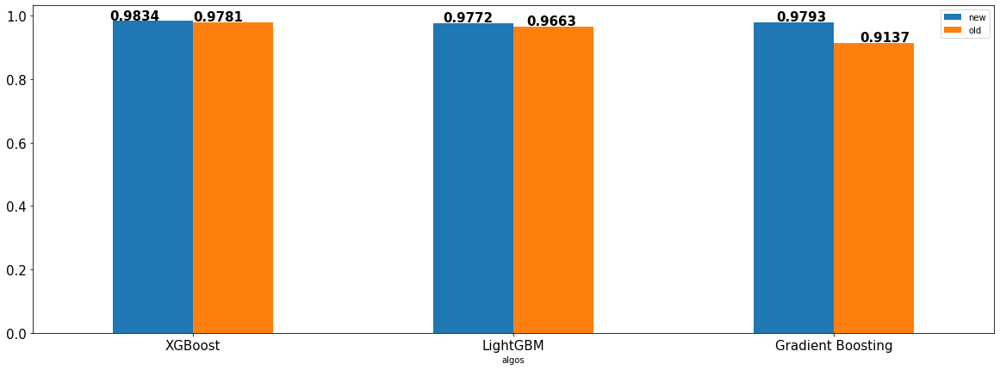

In [42]:
ax = dd.plot(x='algos', kind='bar', figsize=(20, 7), rot=0, fontsize=15) 

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.04, p.get_height() * 1.005) ,color = 'black', fontweight = 'bold', fontsize=15 )

In [115]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58924 entries, 0 to 58923
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   step            58924 non-null  float64
 1   amount          58924 non-null  float64
 2   oldbalanceOrg   58924 non-null  float64
 3   newbalanceOrig  58924 non-null  float64
 4   oldbalanceDest  58924 non-null  float64
 5   newbalanceDest  58924 non-null  float64
 6   amount_Band     58924 non-null  int32  
 7   step_Band       58924 non-null  int32  
 8   type_CASH_IN    58924 non-null  uint8  
 9   type_CASH_OUT   58924 non-null  uint8  
 10  type_DEBIT      58924 non-null  uint8  
 11  type_PAYMENT    58924 non-null  uint8  
 12  type_TRANSFER   58924 non-null  uint8  
dtypes: float64(6), int32(2), uint8(5)
memory usage: 3.4 MB


## save XGBoost model :

In [104]:
xgb_clf = xgb.XGBClassifier(colsample_bytree= 1,gamma=0.2, learning_rate= 0.1, max_depth= 6, min_child_weight= 1, n_estimators= 1000,
 nthread= 4, objective= 'binary:logistic', reg_alpha= 0.2, scale_pos_weight=1, seed= 27, subsample= 0.7).fit(X_train, y_train)


In [105]:
import joblib

joblib.dump(xgb_clf, 'Model_Aprroach_Transaction_V02.joblib')

['Model_Aprroach_Transaction_V02.joblib']

In [ ]:
dfPredT.columns :  Index(['step', 'amount', 'oldbalanceOrg', 'newbalanceOrig', 'oldbalanceDest',
       'newbalanceDest', 'isFraud', 'amount_Band', 'step_Band', 'type_CASH_IN',
       'type_CASH_OUT', 'type_DEBIT', 'type_PAYMENT', 'type_TRANSFER'],